# Calculating Betweenness Centrality using Python

In [1]:
import networkx as nx
import osmnx as ox
import pandas as pd
import geopandas as gpd
ox.config(use_cache=True, log_console=True)

C:\Users\drn20\AppData\Local\Temp\ipykernel_3084\1101155063.py:5: FutureWarning: The `utils.config` function is deprecated and will be removed in the v2.0.0 release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  ox.config(use_cache=True, log_console=True)


Download OSM data for a specific place

In [2]:
place = 'Heidelberg, Germany'
graph = ox.graph_from_place(place, network_type='drive')

Plot the graph

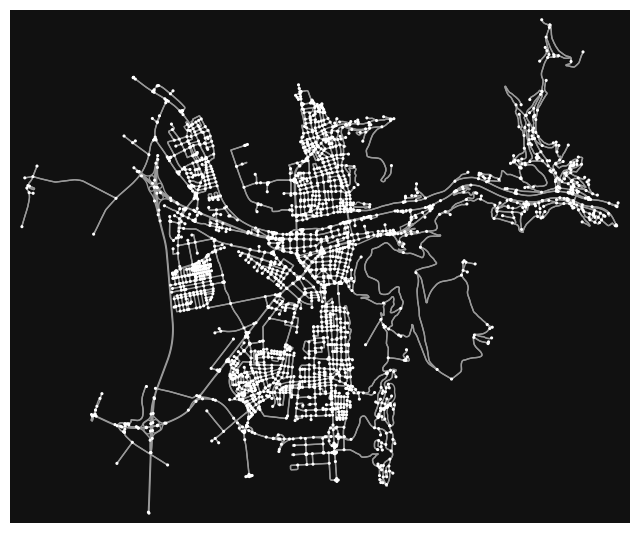

In [7]:
fig, ax = ox.plot_graph(graph, node_size=5)

### Centrality

Calculate betweenness centrality using the shortest routes (i.e. `weight='length'` means that we use the length of each edge).

In [8]:
betweenness_centrality = nx.edge_betweenness_centrality(graph, weight="length")

Convert the values in `betweenness_centrality` into a `pandas.Dataframe`.

In [9]:
centrality_df = pd.DataFrame(index=betweenness_centrality.keys(), data=betweenness_centrality.values())

Name the two index columns of the `centrality_df` 'u' and 'v'.

In [10]:
centrality_df.reset_index(inplace=True)
centrality_df.columns = ['u', 'v', 'key', 'centrality']
centrality_df = centrality_df.set_index(['u', 'v', 'key'])

In [11]:
centrality_df

centrality
u           v          key            
457111      457117     0      0.000000
            13888101   0      0.001824
468756      267042970  0      0.001743
            593007     0      0.000054
510913      1574280917 0      0.000350
...                                ...
11932808390 267164674  0      0.001048
            433220268  0      0.000001
12062036688 276772768  0      0.000350
12062036692 355897938  0      0.001422
            355897937  0      0.000082

[6670 rows x 1 columns]

Converting the graph to a `geopandas.GeoDataFrame` yields two dataframes. One for the nodes, and one for the edges.

In [20]:
nodes_df, edges_df = ox.graph_to_gdfs(graph)

Join the `centrality_df` with the `edges_df`.

In [13]:
centrality_gdf = centrality_df.join(edges_df[['osmid', 'geometry']])
centrality_gdf = gpd.GeoDataFrame(centrality_gdf, crs=4326)

In [14]:
centrality_gdf

centrality  \
u           v          key               
457111      457117     0      0.000000   
            13888101   0      0.001824   
468756      267042970  0      0.001743   
            593007     0      0.000054   
510913      1574280917 0      0.000350   
...                                ...   
11932808390 267164674  0      0.001048   
            433220268  0      0.000001   
12062036688 276772768  0      0.000350   
12062036692 355897938  0      0.001422   
            355897937  0      0.000082   

                                                                        osmid  \
u           v          key                                                      
457111      457117     0    [24559588, 24559589, 143862037, 143862040, 614...   
            13888101   0                                            143862051   
468756      267042970  0                                [306700546, 24560772]   
            593007     0                               [191139657, 143865915]   
510913      1574280917 0    [191139655, 4643062, 78781591, 348374905, 3483...   
...                                                                       ...   
11932808390 267164674  0                                [225564945, 24573324]   
            433220268  0                                            250271500   
12062036688 276772768  0                                 [25793216, 25793215]   
12062036692 355897938  0                                             76903629   
            355897937  0                               [1302363072, 31789285]   

                                                                     geometry  
u           v          key                                                     
457111      457117     0    LINESTRING (8.63495 49.41151, 8.63483 49.41186...  
            13888101   0    LINESTRING (8.63495 49.41151, 8.63492 49.41194...  
468756      267042970  0    LINESTRING (8.63309 49.37625, 8.63294 49.37608...  
            593007     0    LINESTRING (8.63309 49.37625, 8.63285 49.37549...  
510913      1574280917 0    LINESTRING (8.63153 49.35323, 8.63157 49.35408...  
...                                                                       ...  
11932808390 267164674  0    LINESTRING (8.61514 49.37381, 8.61518 49.37388...  
            433220268  0    LINESTRING (8.61514 49.37381, 8.61519 49.37379...  
12062036688 276772768  0    LINESTRING (8.66944 49.37451, 8.66947 49.37454...  
12062036692 355897938  0    LINESTRING (8.66718 49.37823, 8.66719 49.37821...  
            355897937  0    LINESTRING (8.66718 49.37823, 8.66679 49.37895...  

[6670 rows x 3 columns]

Now that the centrality values have been joined with the edges which include the geometries, we can plot the centrality values of the road network on a map using the `geopandas.explore()` function.

In [15]:
centrality_gdf.explore(column='centrality', cmap='magma_r', tiles='cartodbpositron')    

### Betweenness centrality using the fastest routes
Calculate centrality using the fastest route instead of the shortest route.


1. Assign travel speed values to each edge using the `ox.add_edge_speeds` function. **Fill in the missing road types in the dictionary below** based on the [openrouteservice documetation on travel speeds](https://github.com/GIScience/openrouteservice/blob/main/docs/technical-details/travel-speeds/waytype-speeds.md).

In [5]:
# Speed_limits for cars km/h
hwy_speeds = {"motorway": 100,
    "motorway_link": 60,
    "motorroad": 90,
    "trunk": 85,
    "trunk_link": 60,
    "primary": 65,
    "primary_link": 50,
    "secondary": 60,
    "secondary_link": 50,
    "tertiary": 50,
    "tertiary_link": 40,
    "unclassified": 30,
    "residential": 30,
    "living_street": 10,
    "service": 20,
    "road": 20,
    "track": 15} #etc
graph_with_speeds = ox.add_edge_speeds(graph, hwy_speeds)

2. Calculate the travel time for each edge using the `ox.add_edge_travel_times` function.

In [6]:
# Add edge travel time(seconds) to graph as a new travel_time edge attribute
graph_with_travel_time = ox.add_edge_travel_times(graph_with_speeds)

3. Calculate betweenness centrality again using the `nx.edge_betweenness_centrality` but pass `weight="travel_time` as an argument.


In [18]:
betweenness_centrality_time = nx.edge_betweenness_centrality(graph_with_travel_time, weight="travel_time")

4. Convert the centrality value to a `pandas.DataFrame` and join it with the `edges_df` dataframe as above and visualize the result in a map.

In [19]:
# Convert the centrality values to a pandas DataFrame
centrality_time_df = pd.DataFrame(index=betweenness_centrality_time.keys(), data=betweenness_centrality_time.values())
centrality_time_df.reset_index(inplace=True)
centrality_time_df.columns = ['u', 'v', 'key', 'centrality']
centrality_time_df = centrality_time_df.set_index(['u', 'v', 'key'])

# Join with edges dataframe
centrality_time_df = centrality_time_df.join(edges_df[['osmid', 'geometry']])
centrality_time_gdf = gpd.GeoDataFrame(centrality_time_df, crs=4326)

In [20]:
centrality_time_gdf

centrality  \
u           v          key               
457111      457117     0      0.000000   
            13888101   0      0.007743   
468756      267042970  0      0.005136   
            593007     0      0.000083   
510913      1574280917 0      0.000350   
...                                ...   
11932808390 267164674  0      0.001048   
            433220268  0      0.000001   
12062036688 276772768  0      0.000350   
12062036692 355897938  0      0.001036   
            355897937  0      0.000245   

                                                                        osmid  \
u           v          key                                                      
457111      457117     0    [24559588, 24559589, 143862037, 143862040, 614...   
            13888101   0                                            143862051   
468756      267042970  0                                [306700546, 24560772]   
            593007     0                               [191139657, 143865915]   
510913      1574280917 0    [191139655, 4643062, 78781591, 348374905, 3483...   
...                                                                       ...   
11932808390 267164674  0                                [225564945, 24573324]   
            433220268  0                                            250271500   
12062036688 276772768  0                                 [25793216, 25793215]   
12062036692 355897938  0                                             76903629   
            355897937  0                               [1302363072, 31789285]   

                                                                     geometry  
u           v          key                                                     
457111      457117     0    LINESTRING (8.63495 49.41151, 8.63483 49.41186...  
            13888101   0    LINESTRING (8.63495 49.41151, 8.63492 49.41194...  
468756      267042970  0    LINESTRING (8.63309 49.37625, 8.63294 49.37608...  
            593007     0    LINESTRING (8.63309 49.37625, 8.63285 49.37549...  
510913      1574280917 0    LINESTRING (8.63153 49.35323, 8.63157 49.35408...  
...                                                                       ...  
11932808390 267164674  0    LINESTRING (8.61514 49.37381, 8.61518 49.37388...  
            433220268  0    LINESTRING (8.61514 49.37381, 8.61519 49.37379...  
12062036688 276772768  0    LINESTRING (8.66944 49.37451, 8.66947 49.37454...  
12062036692 355897938  0    LINESTRING (8.66718 49.37823, 8.66719 49.37821...  
            355897937  0    LINESTRING (8.66718 49.37823, 8.66679 49.37895...  

[6670 rows x 3 columns]

In [21]:
# Visualize values on the map
centrality_time_gdf.explore(column='centrality', cmap='magma_r', tiles='cartodbpositron')    

### Geographically adapted betweenness centrality

1. Get start and destination nodes in the graph from geographic coordinates using the `nearest_nodes` function.

In [8]:
origin_node = ox.nearest_nodes(graph, 8.3, 50.3)

In [9]:
destination_node = ox.nearest_nodes(graph, 8.7, 49.4)

2. Calculate route between the two nodes using the `ox.shortest_path()` function.

In [10]:
route = ox.shortest_path(graph_with_travel_time, origin_node, destination_node, weight="travel_time")

3. Plot the route using `ox.plot_graph_route`

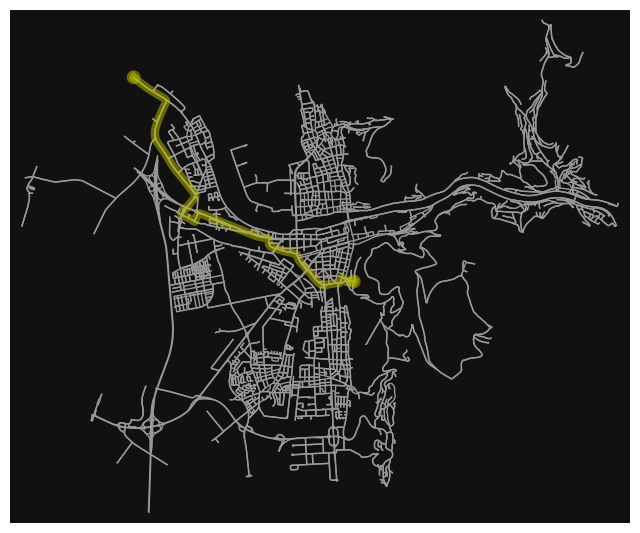

In [12]:
fig, ax = ox.plot_graph_route(graph_with_travel_time, route, route_color="y", route_linewidth=6, node_size=0)

4. Convert the route to a `geopandas.GeoDataFrame` using the `ox.utils_graph.route_to_gdf`.

In [13]:
route_gdf = ox.routing.route_to_gdf(graph_with_travel_time, route)
route_gdf

,,,osmid,lanes,name,highway,maxspeed,oneway,reversed,length,geometry,speed_kph,travel_time,ref,bridge,width,junction
u,v,key,,,,,,,,,,,,,,,
271023140,1029587271,0,27243351,NaN,Ergelweg,residential,30,False,False,7.614,"LINESTRING (8.62682 49.44016, 8.62675 49.44011)",30.0,0.9,NaN,NaN,NaN,NaN
1029587271,268967490,0,27243351,NaN,Ergelweg,residential,30,False,False,5.392,"LINESTRING (8.62675 49.44011, 8.62670 49.44007)",30.0,0.6,NaN,NaN,NaN,NaN
268967490,926233559,0,27777096,1,Heidelberger Straße,secondary,50,True,False,54.874,"LINESTRING (8.62670 49.44007, 8.62689 49.43998...",50.0,4.0,L 637,NaN,NaN,NaN
926233559,456024639,0,"[38534529, 322328924, 174659398]",2,NaN,secondary,70,False,True,474.667,"LINESTRING (8.62734 49.43981, 8.62775 49.43962...",70.0,24.4,L 637,NaN,NaN,NaN
456024639,3291057189,0,322328736,3,NaN,secondary,70,False,True,5.293,"LINESTRING (8.63268 49.43733, 8.63274 49.43731)",70.0,0.3,L 637,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268926771,473603182,0,24745095,NaN,Steigerweg,tertiary,30,True,False,75.552,"LINESTRING (8.69067 49.40020, 8.69079 49.40018...",30.0,9.1,NaN,NaN,NaN,NaN
473603182,268926775,0,"[870286222, 24745095]",NaN,Steigerweg,tertiary,30,True,False,34.213,"LINESTRING (8.69154 49.39984, 8.69156 49.39983...",30.0,4.1,NaN,NaN,NaN,NaN
268926775,465552055,0,"[392689545, 25917442, 24841419]",2,Steigerweg,tertiary,30,False,False,38.630,"LINESTRING (8.69181 49.39960, 8.69183 49.39958...",30.0,4.6,NaN,yes,6.1,NaN


In [14]:
route_gdf.explore()

5. Generate 100 routes by choosing random start and endpoints.

In [15]:
import numpy as np
n = 100
routes_valid = []
temp = n - len(routes_valid)
while temp != 0:
    # Caculate n shortest-path routes using random origin-destination paris
    origs = np.random.choice(graph_with_travel_time.nodes, size=temp, replace=True)
    dests = np.random.choice(graph_with_travel_time.nodes, size=temp, replace=True)
    routes = ox.shortest_path(graph, origs, dests, weight="travel_time")
    # Extract valid routes
    temp_valid = [r for r in routes if r is not None]
    routes_valid.extend(temp_valid)
    print("Vaild", len(routes_valid))
    # Reselect routes
    temp = n - len(routes_valid)

Vaild 100


6. Merge all route dataframes using the `pd.concat` function

In [16]:
routes_gdf_list = [ox.routing.route_to_gdf(graph_with_travel_time, route) for route in routes_valid]
routes_df = pd.concat(routes_gdf_list)
routes_gdf = gpd.GeoDataFrame(routes_df, crs=4326)

In [17]:
routes_gdf.explore()

7. Calculate betweenness centrality indicator of the graph by grouping the routes by the columns 'u', 'v' and 'key' and counting the number of features.

In [18]:
# Calculate betweenness centrality for edges
centrality_df = routes_gdf.groupby(['u', 'v', 'key']).count()["osmid"]
centrality_df = pd.DataFrame(centrality_df)
centrality_df.rename(columns={"osmid": "centrality"}, inplace=True)

8. Join the dataframe containing the manually computed centrality values with the `edges_df` dataframe. Plot the manually computed betweenness centrality on an interactive map.

In [21]:
# Join with edges dataframe
centrality_df = centrality_df.join(edges_df[['osmid', 'geometry']])

In [22]:
centrality_gdf = gpd.GeoDataFrame(centrality_df, geometry="geometry", crs=4326)

In [23]:
# Visualize values on the map
centrality_gdf.explore(column='centrality', cmap='magma_r', tiles='cartodbpositron')

### Bonus

Write a function which chooses a start and destination node from the graph based on the population distribution from the [Global Human Settlement population layer](https://ghsl.jrc.ec.europa.eu/download.php?ds=pop).